In [23]:
from YOLOv8_Explainer import yolov8_heatmap, display_images
import matplotlib.pyplot as plt
from datasets import load_dataset
from matplotlib.pyplot import imshow
import cv2

In [24]:
# Initialize the YOLOv8 Explainer with Grad-CAM
model = yolov8_heatmap(
    weight="yolo_weights/yolov8SC.pt",  # Path to your YOLOv8 model weights
    conf_threshold=0.4,  # Confidence threshold for detections
    method="GradCAM",  # Use Grad-CAM instead of EigenCAM
    layer=[5, 10, 15, 20, -3],  # Target layers for Grad-CAM
    ratio=0.005,  # Ratio for heatmap overlay
    show_box=True,  # Show bounding boxes on the image
    renormalize=False,  # Do not renormalize the heatmap
)
dataset = load_dataset("marmal88/skin_cancer")
test_split = dataset["test"]

label_mapping = {
    "melanoma": "Malignant",
    "melanocytic_Nevi": "Malignant",
    "dermatofibroma": "Benign",
    "basal_cell_carcinoma": "Malignant",
    "vascular_lesions": "Benign",
    "actinic_keratoses": "Malignant",
    "benign_keratosis-like_lesions": "Benign"
}

Model summary: 129 layers, 11,136,374 parameters, 0 gradients, 28.6 GFLOPs


Image 0


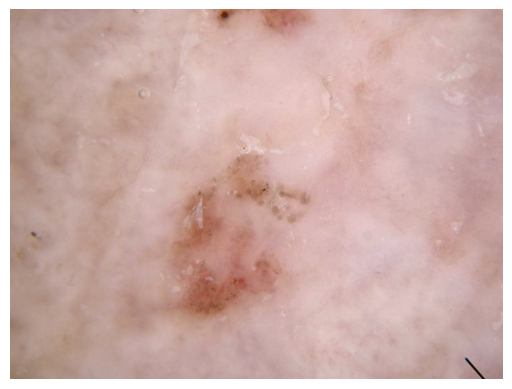

Image 1


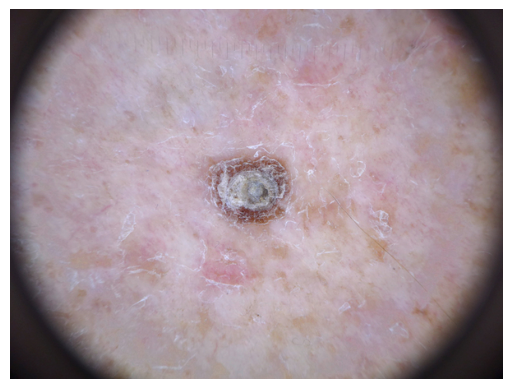

Image 2


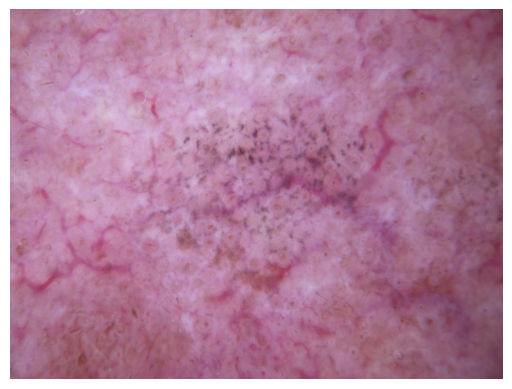

Image 3


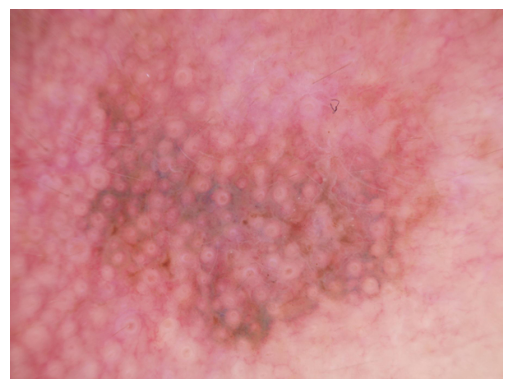

Image 4


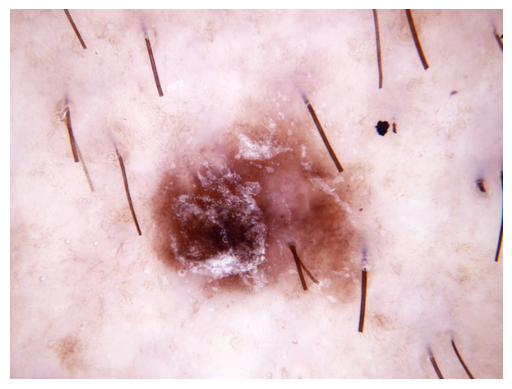

Image 5


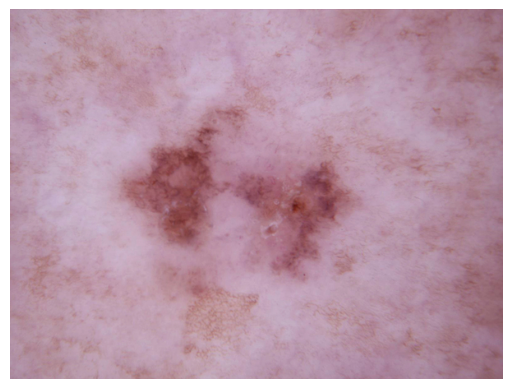

Image 6


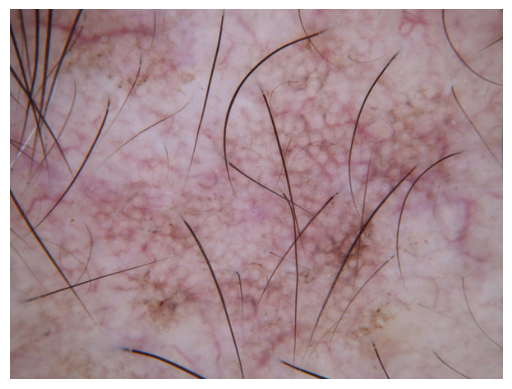

Image 7


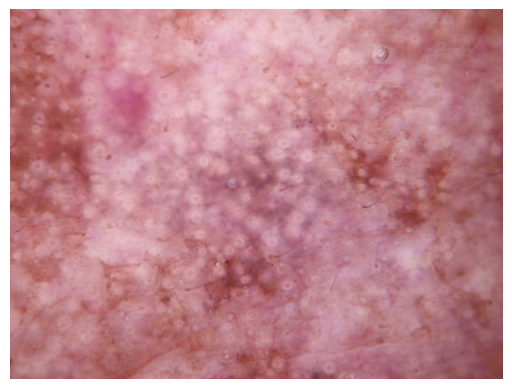

Image 8
'int' object has no attribute 'backward'


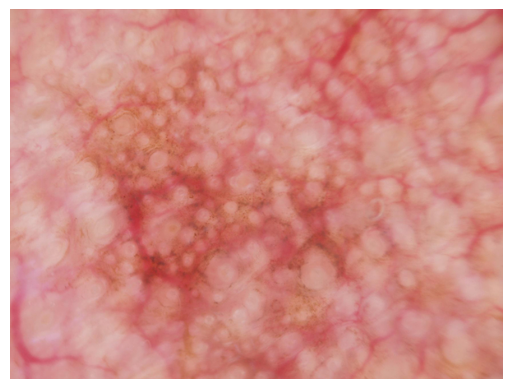

In [28]:

images = []
ground_truths = []
for i in range(9):
    print(f"Image {i}")
    ground_truths.append(label_mapping[test_split[i]["dx"]])
    # Generate Grad-CAM heatmaps for an image
    images.append(model(
        img_path=f"test_img/image_{i}.png",  # Path to your input image
    ))
    img = cv2.imread(f"test_img/image_{i}.png")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis('off')  # Turn off axis labels and ticks
    plt.show()

Image 0, with Ground Truth: Malignant


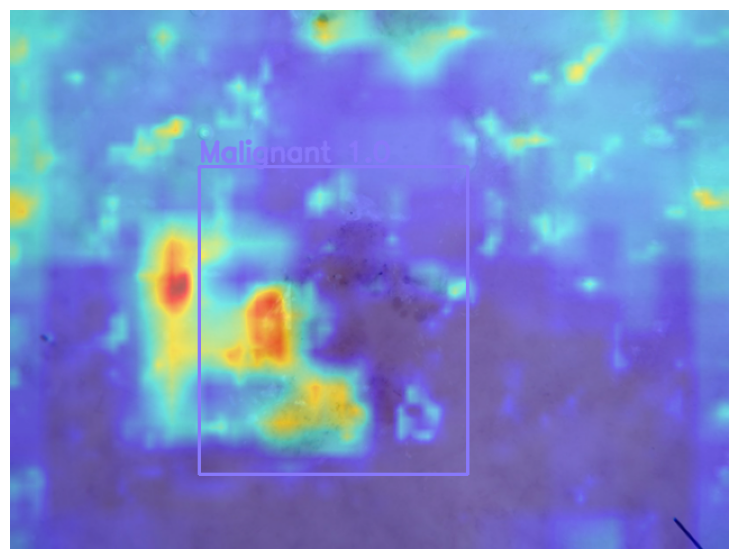

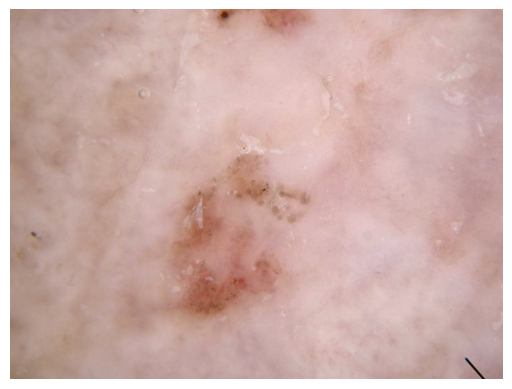

Image 1, with Ground Truth: Malignant


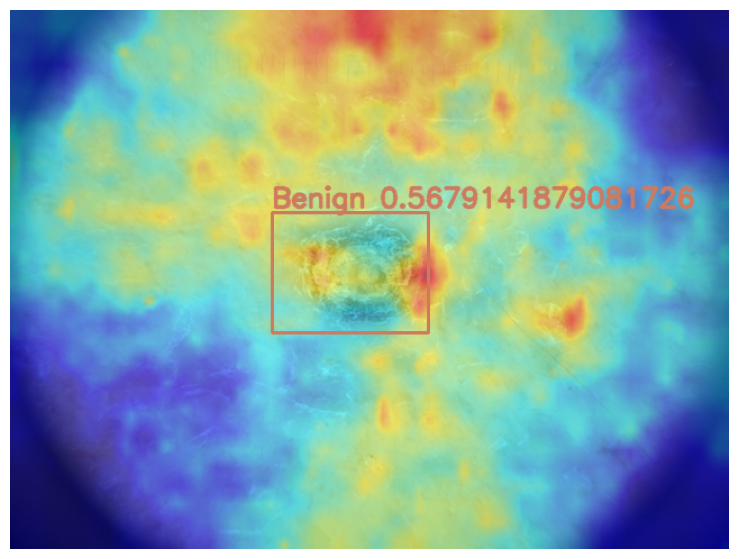

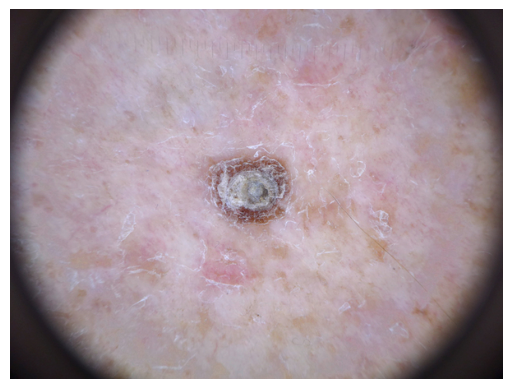

Image 2, with Ground Truth: Malignant


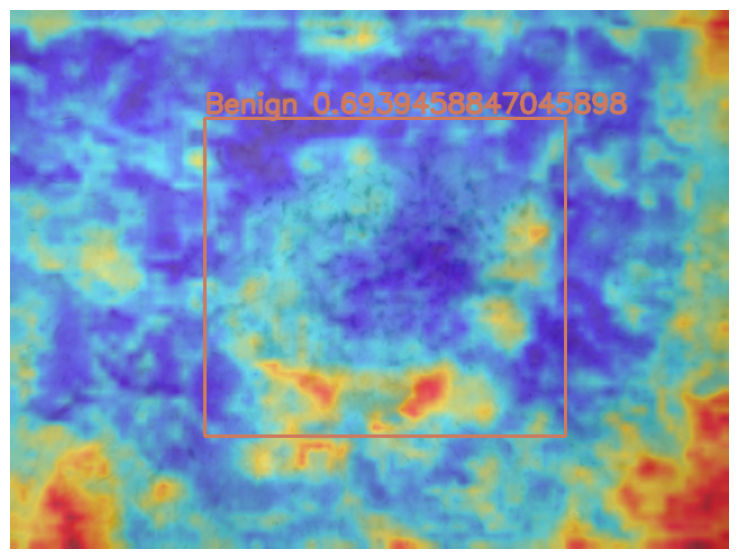

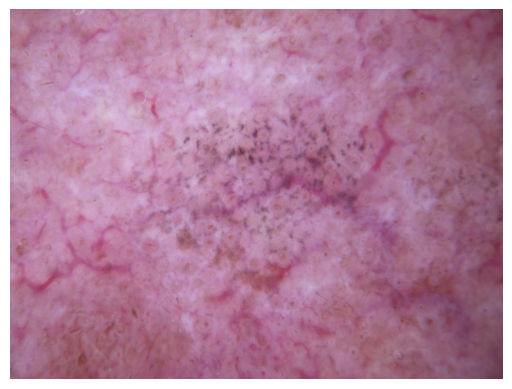

Image 3, with Ground Truth: Malignant


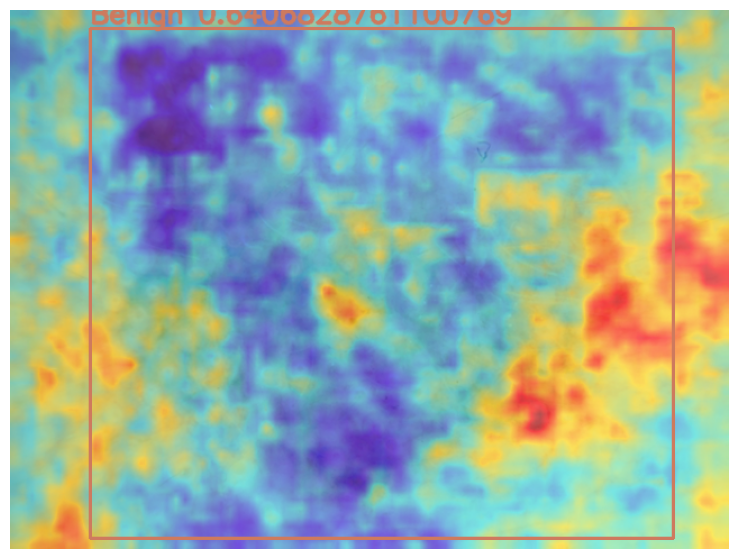

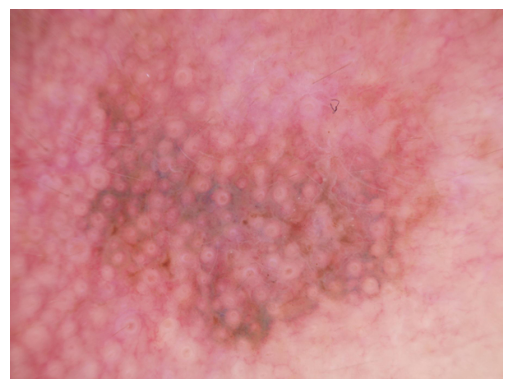

Image 4, with Ground Truth: Malignant


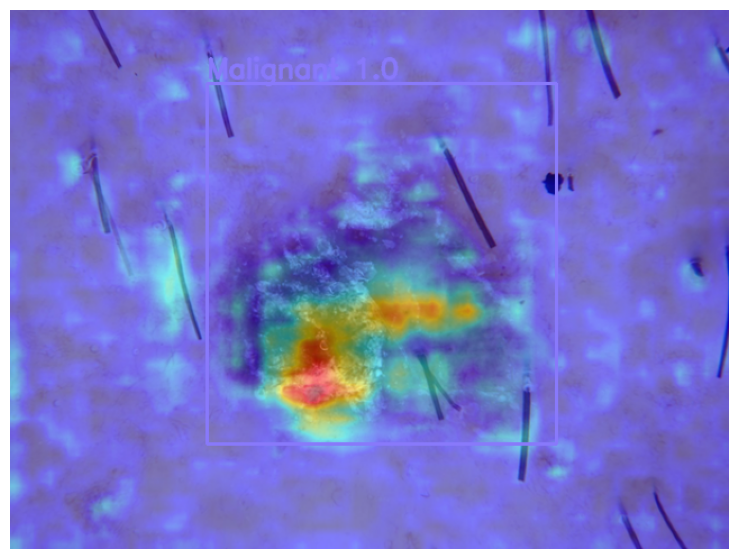

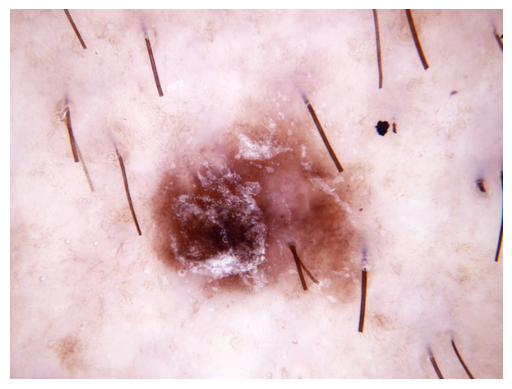

Image 5, with Ground Truth: Malignant


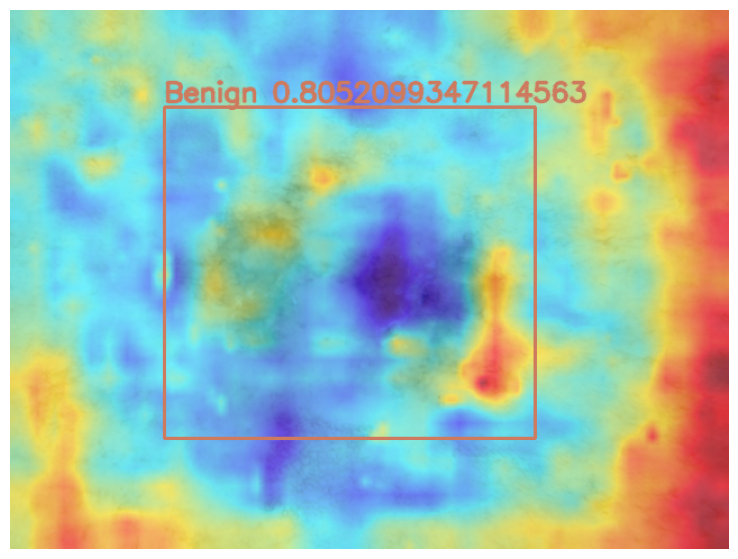

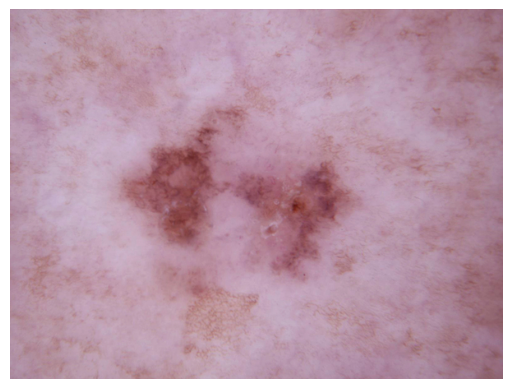

Image 6, with Ground Truth: Malignant


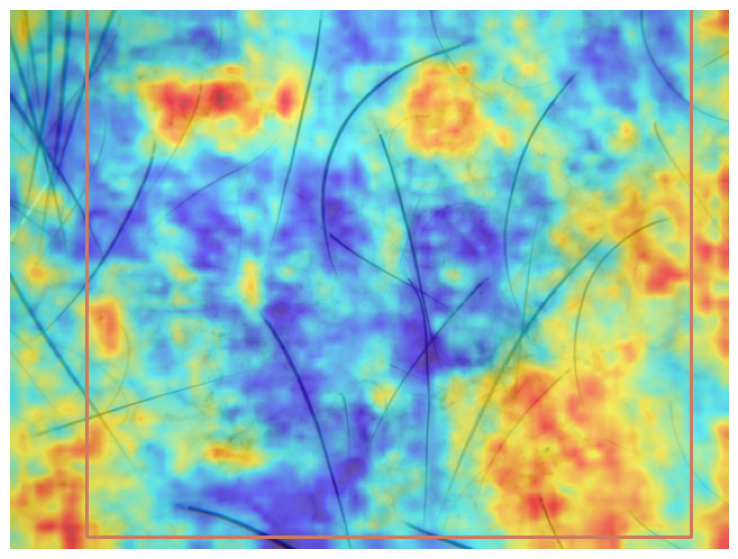

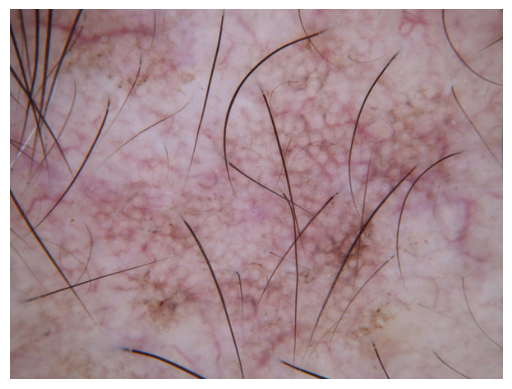

Image 7, with Ground Truth: Malignant


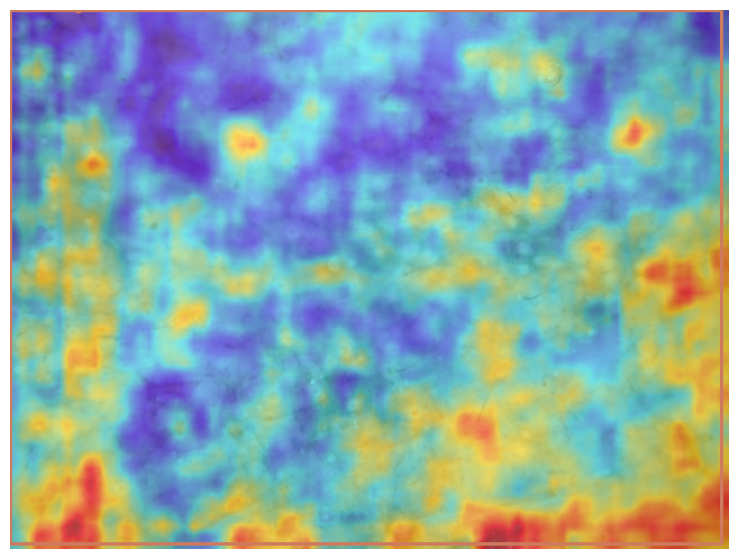

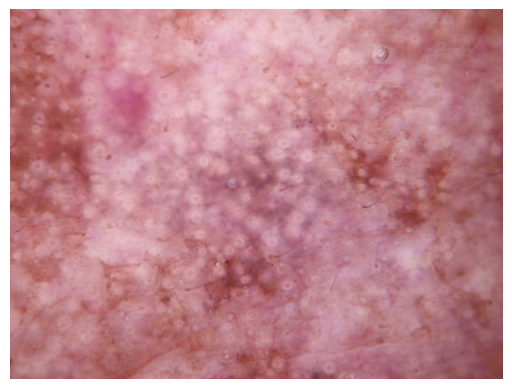

Image 8, with Ground Truth: Malignant


TypeError: Image data of dtype object cannot be converted to float

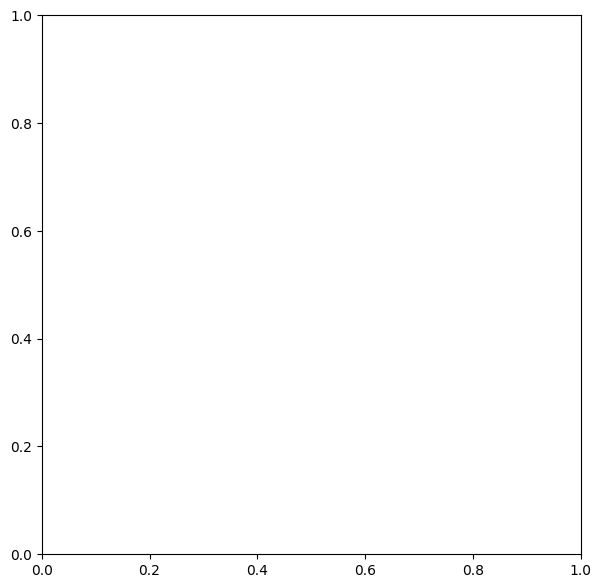

In [27]:
for i,image in enumerate(images):
    print(f"Image {i}, with Ground Truth: {ground_truths[i]}")
    display_images(image)
    img = cv2.imread(f"test_img/image_{i}.png")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis('off')  # Turn off axis labels and ticks
    plt.show()

